In [4]:
# import 
# Standard libraries
import os
import glob
import warnings
import gc

# Data manipulation and analysis libraries
import numpy as np
import pandas as pd
import dask.dataframe as dd
import dask.array as da
import xarray as xr
import geopandas as gpd
from shapely.geometry import Point
from netCDF4 import Dataset
# geopandas 
import shapely

from shapely.geometry import Polygon, Point, box as shapely_box
import geopandas as gpd

#
import h3
# Dask diagnostics and progress bar
from dask.diagnostics import ProgressBar

# Plotting libraries
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.cm import ScalarMappable
from matplotlib.ticker import MultipleLocator, ScalarFormatter
import matplotlib.cm as cm
from matplotlib.colors import LinearSegmentedColormap, LogNorm
import cartopy.crs as ccrs
from pylag.processing.plot import FVCOMPlotter, create_figure, colourmap
from pylag.processing.plot import colourmap 
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
from matplotlib.colorbar import ColorbarBase
from netCDF4 import Dataset
import cartopy.crs as ccrs
import warnings
warnings.filterwarnings("ignore", message="Measured.*not supported")

In [5]:
# Inputs
Streamwatershed_path = "/mnt/d/Users/abolmaal/Arcgis/NASAOceanProject/GIS_layer/Streamwatershed/PointWaterdhed_LH_NAD1983.shp"
# Define Core Directories
# -----------------------------
GIS_LAYERS = '/home/abolmaal/Data/GIS_layer'  # For general GIS layers
Lakes = '/mnt/hydroglg/Data/GIS_Data/Derived/MI_Model/Natural_Earth_Great_Lakes_Buffer_Edit.shp'
counties = '/mnt/hydroglg/Data/GIS_Data/Downloaded/Worldwide_Datasets/Natural_Earth_Data/10m_cultural/ne_10m_admin_0_countries_lakes.shp'
#NHDHRPLUS = '/mnt/d/Users/abolmaal/Arcgis/NASAOceanProject/GIS_layer/NHDHRPLUS/NetworkNHDFlowline_nati_Clip.shp'
NHDflowline = '/mnt/d/Users/abolmaal/Arcgis/NASAOceanProject/GIS_layer/NHDHRPLUS/NHDplusv1_Plus04_flowline.shp'

# read the shapefile for NHD flowlines
NHD_flowline = gpd.read_file(NHDflowline)
# initial position files
initial_position = '/mnt/d/Users/abolmaal/Arcgis/NASAOceanProject/GIS_layer/pourpoints/Streamwatershedpourpoints_NAD1983.shp'
# read the shapefile for inial positions
initial_positions = gpd.read_file(initial_position)
# read the shapefile for Lakes
Lakes = gpd.read_file(Lakes)
# read the shapefile for Counties
counties = gpd.read_file(counties)

#CW_path = '/mnt/d/Users/abolmaal/Arcgis/NASAOceanProject/GIS_layer/CoastalWatersheds/Erase_Riperian'  # Coastal wetlands (50m buffer)
# CW_path = '/mnt/d/Users/abolmaal/Arcgis/NASAOceanProject/GIS_layer/Coastalwetland/hitshoreline/'  # Alternative path (optional)
out_dir = '/home/abolmaal/modelling/FVCOM/Huron/TotalNP'
# FVCOM grid metrics file
grid_metrics_file_name = '/home/abolmaal/modelling/FVCOM/Huron/input/gridfile/grid_metrics_huron_senseflux_Seasonal.nc'
# -----------------------------
# Coastal Wetland Shapefiles (Buffered 50m)
# -----------------------------
# CW_avg_path   = os.path.join(CW_path, 'Wetland_connected_avg_erasebuff_50.shp')
# CW_low_path   = os.path.join(CW_path, 'Wetland_connected_low_erasebuff_50.shp')
# CW_high_path  = os.path.join(CW_path, 'Wetland_connected_high_erasebuff_50.shp')
# CW_surge_path = os.path.join(CW_path, 'Wetland_connected_surge_erasebuff_50.shp')
CW_path = '/mnt/d/Users/abolmaal/Arcgis/NASAOceanProject/GIS_layer/CoastalWatersheds/Buff_CW'
# -----------------------------
# Coastal Wetland Shapefiles (Buffered 50m)
# -----------------------------)
CW_avg_path   = os.path.join(CW_path, 'Wetland_connected_avg_erasebuff_50_buff50_removeoverlap.shp')
CW_low_path   = os.path.join(CW_path, 'Wetland_connected_low_erasebuff_50_buff50_removeoverlap.shp')
CW_high_path  = os.path.join(CW_path, 'Wetland_connected_high_erasebuff_50_buff50_removeoverlap.shp')
CW_surge_path = os.path.join(CW_path, 'Wetland_connected_surge_erasebuff_50_buff50_removeoverlap.shp')
# Load shapefiles as GeoDataFrames
CW_avg   = gpd.read_file(CW_avg_path)
CW_low   = gpd.read_file(CW_low_path)
CW_high  = gpd.read_file(CW_high_path)
CW_surge = gpd.read_file(CW_surge_path)
# FVCOM grid metrics file
grid_metrics_file_name = '/home/abolmaal/modelling/FVCOM/Huron/input/gridfile/grid_metrics_huron_senseflux_Seasonal.nc'

# -----------------------------
# Direct Nutrient Load (Stream Watersheds)
# -----------------------------
Direct_Nutrient_load = '/mnt/d/Users/abolmaal/Arcgis/NASAOceanProject/ZonalStats/DirectTNTP_StreamWatresheds.csv'
DirectStreamWatershed_NutrientLoad = pd.read_csv(Direct_Nutrient_load)

# InDirect Nutrient Load (Coastal Wetlands)
# -
# Categories and release lengths
categories = ['avg', 'high', 'low', 'surge']
year = 23
release_lens = ["first1days", "first5days", "first10days", "first26days", "first60days", "first90days"]

# Read all total loads
for cat in categories:
    for rlen in release_lens:
        total_load_file = os.path.join(out_dir, f'Total_Direct_Indirect_Loads_{cat}_{year}_{rlen}.csv')
        if os.path.exists(total_load_file):
            globals()[f'TotalLoad_CW_{cat}_{rlen}'] = pd.read_csv(total_load_file)
        else:
            print(f"⚠️ Missing file: {total_load_file}")



In [12]:
# output and figures
output_figures = '/home/abolmaal/modelling/FVCOM/Huron/Figures'

# Parameters

In [6]:
TARGET_CRS = "EPSG:3174"   # Great Lakes Albers

release_times = ["2301", "2302", "2303", "2304", "2305", "2306", "2307", "2308", "2309", "2310", "2311", "2312"]

# Figure parameters
blues = ['#f7fbff', '#deebf7', '#c6dbef', '#9ecae1',
         '#6baed6', '#4292c6', '#2171b5', '#084594']
# Create colormap
blue_shades = mcolors.LinearSegmentedColormap.from_list("blue_shades", blues)
# ✅ Correct way to reverse
blue_shades_reversed = blue_shades.reversed()

# Define a list of green shades for the colormap
greens =  ["#e5f9e0",  # very light mint
    "#a8f5a0",  # soft green
    "#70e070",  # medium green
    "#33cc33",  # strong bright green
    "#009933",  # forest green
    "#006622",  # dark green
    "#003311"]  # very dark green
# Create a custom green colormap
green_shades = LinearSegmentedColormap.from_list('custom_green', greens)

# Replace pink_cmap with viridis and plasma
viridis_cmap = plt.colormaps['viridis']  # Updated to use new interface
plasma_cmap = plt.colormaps['plasma']  # Updated to use new interface
reversed_plasma_cmap = plasma_cmap.reversed()  # Reversed colormap  
# Set up plotting parameters
font_size = 18
cmap = plt.colormaps['hsv_r']  # Fixed: using an existing colormap (hsv_r)
# figure sizes

double_size=(6.69, 5)
single_size=(3.35, 5)
# Extent of the plot
#extents = np.array([275, 277.69, 43, 46.3], dtype=float)

#extents_ausable = np.array([276.5, 276.8, 45, 45.5], dtype=float)

# main extent for lake huron
extent=[-84, -82.35, 42.65, 45.65]

# inset boxes that hit CW (EPSG:3174 meters); adjust as you like
inset_extents=[
    [1_070_000, 1_087_000, 930_000, 950_000],
    [1_040_000, 1_057_000, 776_000, 796_000],
    [1_145_000, 1_162_000, 768_000, 788_000]]

inset_fig_boxes=[[0.685,0.64,0.18,0.24],[0.685,0.37,0.18,0.24],[0.685,0.10,0.18,0.24]]

# Some parameters for the Zonal Stats Fields
# Fields to calculate / Direct delivery to Watersheds
# Fields to calculate / Direct delivery to Watersheds
StreamDirectTN = 'StreamDirectTN_kgday'
StreamDirectTP = 'StreamDirectTP_kgday'

# set figure sizes


# Helper Functions 

In [7]:

# ---------- helpers ----------
def _force_to_target(gdf_or_path, src_crs=None, name="layer", target_crs=TARGET_CRS):
    """Force a GeoDataFrame or file path to a target CRS.

    Args:
        gdf_or_path (_type_): _description_
        src_crs (_type_, optional): _description_. Defaults to None.
        name (str, optional): _description_. Defaults to "layer".
        target_crs (_type_, optional): _description_. Defaults to TARGET_CRS.

    Raises:
        ValueError: _description_

    Returns:
        _type_: _description_
    """
    if gdf_or_path is None:
        return None
    gdf = gdf_or_path.copy() if isinstance(gdf_or_path, gpd.GeoDataFrame) else gpd.read_file(gdf_or_path)
    if src_crs is not None:
        gdf = gdf.set_crs(src_crs, allow_override=True)
    elif gdf.crs is None:
        raise ValueError(f"{name}: source CRS is missing; pass {name}_src_crs='EPSG:XXXX'.")
    gdf = gdf[gdf.geometry.notna()].copy()
    try:
        gdf["geometry"] = gdf.geometry.make_valid()
    except Exception:
        gdf["geometry"] = gdf.geometry.buffer(0)
    try:
        gdf = gdf.explode(index_parts=False).reset_index(drop=True)
    except Exception:
        pass
    gdf = gdf[gdf.geometry.notna() & ~gdf.geometry.is_empty].copy()
    gdf_t = gdf.to_crs(target_crs)
    gdf_t = gdf_t[gdf_t.geometry.notna() & ~gdf_t.geometry.is_empty].copy()
    b = None if gdf_t.empty else gdf_t.total_bounds
    print(f"[{name} RAW] crs={gdf.crs} -> [{target_crs}] count={0 if gdf_t.empty else len(gdf_t)} bounds={b}")
    return gdf_t

def _project_extent_4326_to_target(extent_ll, target_crs=TARGET_CRS):
    """
    Convert a lon/lat bounding box (EPSG:4326) into the target projection.

    Args:
      extent_ll: [minlon, maxlon, minlat, maxlat] in degrees.
      target_crs: e.g. EPSG:3174 (Great Lakes Albers)

    Returns:
      [minx, maxx, miny, maxy] in target CRS units (meters).
    """
    minlon, maxlon, minlat, maxlat = extent_ll
    bbox_ll = gpd.GeoSeries([shapely_box(minlon, minlat, maxlon, maxlat)], crs="EPSG:4326")
    minx_p, miny_p, maxx_p, maxy_p = bbox_ll.to_crs(target_crs).total_bounds
    return [minx_p, maxx_p, miny_p, maxy_p]

def _clip_gdf_box(gdf, xmin, xmax, ymin, ymax):
    """
    Spatially clip a GeoDataFrame to a rectangular bounding box.

    Args:
      gdf: input GeoDataFrame
      xmin, xmax, ymin, ymax: box boundaries in the CRS of gdf

    Returns:
      GeoDataFrame with only features intersecting the box.
    """
    if gdf is None or gdf.empty:
        return gdf
    bbox = shapely_box(xmin, ymin, xmax, ymax)
    return gdf[gdf.intersects(bbox)]

def _colormap_from_any(cmap_or_name):
    """
    Accept either a Matplotlib colormap object or a string name.

    If string, looks up via matplotlib.colormaps.
    Ensures user can pass custom or built-in colormaps seamlessly.
    """
    import matplotlib
    if hasattr(cmap_or_name, "__call__") and hasattr(cmap_or_name, "name"):
        return cmap_or_name
    return matplotlib.colormaps.get_cmap(cmap_or_name)

def add_normal_colorbar(fig, ax_or_axes, cmap, norm, *,
                        label="", box=(0.90, 0.74, 0.02, 0.14),
                        ticks=None, tick_right=True, fontsize=14,
                        cbar_high_top=True):
    """
    Add a vertical colorbar to the figure.

    Args:
      fig: the parent Matplotlib figure
      ax_or_axes: one or more axes the cbar applies to
      cmap: colormap
      norm: normalization (e.g. LogNorm)
      label: colorbar label string
      box: [left, bottom, width, height] in fig coordinates
      ticks: optional fixed tick values
      tick_right: if True, draw ticks/labels on right side
      fontsize: label font size
      cbar_high_top: if True (default), higher values appear at the TOP

    Returns:
      The colorbar object.
    """
    if not isinstance(ax_or_axes, (list, tuple)):
        ax_or_axes = [ax_or_axes]
    cax = fig.add_axes(box)
    sm = ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])

    cb = fig.colorbar(sm, cax=cax, orientation="vertical")
    cb.set_label(label, fontsize=fontsize)

    if ticks is not None:
        # keep ticks in ascending order; axis inversion (if any) will handle the visual
        cb.set_ticks(ticks)
        if isinstance(norm, LogNorm):
            cb.set_ticklabels([f"{t:.1e}" for t in ticks])

    cb.ax.tick_params(labelsize=fontsize-2)

    if tick_right:
        cb.ax.yaxis.set_label_position("right")
        cb.ax.yaxis.tick_right()

    # Control which side shows higher values
    if not cbar_high_top:
        cb.ax.invert_yaxis()
    return cb

# ticks helpers (still here in case you turn them on later)
def _apply_ticks(ax, minx, maxx, miny, maxy, interval_m=20000, fontsize=12, show=False):
    """
    Apply axis ticks for maps.

    Args:
      ax: the axes to update
      minx, maxx, miny, maxy: limits in meters
      interval_m: tick spacing in meters
      fontsize: label font size
      show: if False, hides ticks/labels (clean figure)

    Returns:
      None (modifies ax in place).
    """
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    if not show:
        ax.set_xticks([]); ax.set_yticks([])
        return
    ax.xaxis.set_major_locator(MultipleLocator(interval_m))
    ax.yaxis.set_major_locator(MultipleLocator(interval_m))
    fmt = ScalarFormatter(useMathText=True); fmt.set_powerlimits((-3, 4))
    ax.xaxis.set_major_formatter(fmt); ax.yaxis.set_major_formatter(fmt)
    ax.tick_params(axis='both', which='major', labelsize=fontsize)

# center+size helper for insets
def box_from_center(cx, cy, width_m, height_m):
    """
    Create a bounding box from a center coordinate and dimensions.

    Args:
      cx, cy: center in target CRS
      width_m, height_m: dimensions in meters

    Returns:
      [xmin, xmax, ymin, ymax] box list
    """
    half_w, half_h = width_m/2, height_m/2
    return [cx - half_w, cx + half_w, cy - half_h, cy + half_h]

# inset helpers
def _auto_insets_from_layer(layer_gdf, k=2, buffer_m=3500):
    """
    Auto-generate inset boxes from the largest features in a layer.

    Args:
      layer_gdf: input GeoDataFrame
      k: number of insets to generate
      buffer_m: extra margin in meters around each feature

    Returns:
      List of bounding boxes [xmin, xmax, ymin, ymax] in target CRS
    """
    out = []
    if layer_gdf is None or layer_gdf.empty: return out
    g = layer_gdf.copy()
    if g.geom_type.isin(["Polygon","MultiPolygon"]).any():
        g["area_or_len"] = g.geometry.area
    else:
        g["area_or_len"] = g.geometry.length
    g = g.sort_values("area_or_len", ascending=False)
    for geom in g.geometry.head(k):
        xmin, ymin, xmax, ymax = geom.buffer(buffer_m).bounds
        out.append([xmin, xmax, ymin, ymax])
    return out

def _box_hits(gdf, b):
    """
    Check whether a GeoDataFrame has features inside a box.

    Args:
      gdf: GeoDataFrame
      b: [xmin, xmax, ymin, ymax] box

    Returns:
      True if non-empty intersection, False otherwise
    """
    if gdf is None or gdf.empty: return False
    x0,x1,y0,y1 = b
    return not _clip_gdf_box(gdf, x0,x1,y0,y1).empty

## Adjust CRS

In [8]:
watershed_gdf = gpd.read_file(Streamwatershed_path)

# Reproject if needed
if watershed_gdf.crs != "EPSG:4326":
    watershed_gdf = watershed_gdf.to_crs("EPSG:3174")
    
# set initial positions crs to 3174
initial_positions = _force_to_target(initial_positions, target_crs="EPSG:3174")

[layer RAW] crs=EPSG:3174 -> [EPSG:3174] count=80 bounds=[ 983589.29560957  718976.42850433 1164799.31201039 1019651.24474242]


## Plot

In [26]:
def plot_wetload_distribution_indirect_release_lens(
    cat,
    release_lens,
    grid_metrics_file_name,
    Counties=None,
    CW_layers=None,
    NHD_flowline=None,
    counties_src_crs=None,
    cw_src_crs=None,
    nhd_src_crs=None,
    value_type="N",   # "N" or "P"
    font_size=18,
    resolution=6,
    output_figures=".",
    extent=[-84, -82.35, 42.65, 45.65],
    auto_expand_extent=False,
    extent_padding_m=5000,
    load_cmap="plasma_r",
    cbar_box=(0.90, 0.64, 0.02, 0.20),
    flip_cbar_high_bottom=False,
    show_main_ticks=False,
    main_tick_interval_m=20000,
    show_inset_ticks=False,
    inset_tick_interval_m=5000,
    show_nhd_on_main=False,
    show_nhd_on_insets=True,
    inset_extents=None,
    inset_fig_boxes=None,
    inset_include_hex=True
):
    """
    Plot multipanel maps of *Indirect loads only* for different release_lens,
    with inset zoom boxes (same inset extents drawn on all panels).
    """

    # ================
    # 0. Initialize
    # ================
    counties_t, cw_t, nhd_t = None, None, None

    # Column mapping
    vt = value_type.upper()
    if vt == "N":
        indirect_col = "TotalIndirectCW_TN_grm2yr"
        units = "gr/m²/yr"
    elif vt == "P":
        indirect_col = "TotalIndirectCW_TP_grm2yr"
        units = "gr/m²/yr"
    else:
        raise ValueError("value_type must be 'N' or 'P'")

    # ================
    # 1. FVCOM bathymetry
    # ================
    ds = Dataset(grid_metrics_file_name, "r")
    lon = ds.variables["longitude"][:]
    lat = ds.variables["latitude"][:]
    bathy = -ds.variables["h"][:]
    ds.close()

    bathy_gdf = gpd.GeoDataFrame(
        geometry=[Point(x, y) for x, y in zip(lon, lat)],
        data={"bathy": bathy}, crs="EPSG:4326"
    ).to_crs(TARGET_CRS)

    # ================
    # 2. Layers to target CRS
    # ================
    if Counties is not None:
        counties_t = _force_to_target(Counties, src_crs=counties_src_crs, name="Counties")

    if CW_layers is not None:
        src = CW_layers.get(cat, None) if isinstance(CW_layers, dict) else CW_layers
        if src is not None:
            cw_t = _force_to_target(src, src_crs=cw_src_crs, name=f"CW[{cat}]")

    if NHD_flowline is not None:
        nhd_t = _force_to_target(NHD_flowline, src_crs=nhd_src_crs, name="NHD")

    # ================
    # 3. Extent projection
    # ================
    minx, maxx, miny, maxy = _project_extent_4326_to_target(extent, target_crs=TARGET_CRS)

    bathy_gdf = _clip_gdf_box(bathy_gdf, minx, maxx, miny, maxy)
    if counties_t is not None:
        counties_t = _clip_gdf_box(counties_t, minx, maxx, miny, maxy)
    if cw_t is not None:
        cw_t = _clip_gdf_box(cw_t, minx, maxx, miny, maxy)
    if nhd_t is not None:
        nhd_t = _clip_gdf_box(nhd_t, minx, maxx, miny, maxy)

    # ================
    # 4. Build hexes for each release_len
    # ================
    hexes = []
    all_vals = []
    for rlen in release_lens:
        df = globals().get(f"TotalLoad_CW_{cat}_{rlen}")
        if df is None or df.empty:
            print(f"⚠️ No dataframe found for {cat} – {rlen}, skipping")
            continue

        df = df[df.start_lon.notna() & df.start_lat.notna() &
                (df.start_lon != 0.0) & (df.start_lat != 0.0)].copy()

        df["h3_index"] = df.apply(
            lambda r: h3.latlng_to_cell(r.start_lat, r.start_lon, resolution),
            axis=1
        )

        tmp = df.groupby("h3_index")[indirect_col].mean().reset_index()
        tmp["geometry"] = tmp["h3_index"].apply(
            lambda cell: Polygon([(lon, lat) for lat, lon in h3.cell_to_boundary(cell)])
        )
        gdf = gpd.GeoDataFrame(tmp, geometry="geometry", crs="EPSG:4326").to_crs(TARGET_CRS)
        gdf.rename(columns={indirect_col: "load"}, inplace=True)
        gdf = _clip_gdf_box(gdf, minx, maxx, miny, maxy)

        hexes.append((rlen, gdf))
        all_vals.extend(gdf["load"].astype(float).values)

    # ================
    # 5. Color scale
    # ================
    q05, q95 = np.nanquantile(all_vals, [0.05, 0.95])
    vmin, vmax = max(q05, 1e-12), max(q05*10, q95)

    if flip_cbar_high_bottom and isinstance(load_cmap, str) and not load_cmap.endswith("_r"):
        load_cmap = f"{load_cmap}_r"

    norm = LogNorm(vmin=vmin, vmax=vmax)
    load_cmap_obj = _colormap_from_any(load_cmap)
    bathy_cmap    = blue_shades

    # ================
    # 6. Figure grid
    # ================
    ncols = len(hexes)
    fig, axes = plt.subplots(1, ncols, figsize=(9*ncols, 10), sharex=True, sharey=True)
    if ncols == 1:
        axes = [axes]

    # Colors for inset locator boxes
    inset_colors = ["tab:red", "tab:blue", "tab:purple", "tab:orange"]

    for ax, (rlen, gdf_hex) in zip(axes, hexes):
        # Base layers
        if bathy_gdf is not None and not bathy_gdf.empty:
            ax.scatter(bathy_gdf.geometry.x, bathy_gdf.geometry.y,
                       c=bathy_gdf["bathy"], cmap=bathy_cmap,
                       s=18, marker="s", edgecolor="none", alpha=0.6, zorder=0)
        if counties_t is not None and not counties_t.empty:
            counties_t.plot(ax=ax, facecolor="lightgray", edgecolor="black",
                            linewidth=0.6, zorder=0.5)
        if show_nhd_on_main and nhd_t is not None and not nhd_t.empty:
            nhd_t.plot(ax=ax, color="blue", linewidth=1.0, zorder=1.0)

        # Indirect load hexes
        gdf_hex.plot(ax=ax, column="load", cmap=load_cmap_obj, norm=norm,
                     edgecolor="none", alpha=0.9, zorder=1.5)

        # CW outlines
        if cw_t is not None and not cw_t.empty:
            cw_t.plot(ax=ax, facecolor="none", edgecolor="none",
                      linewidth=2.0, alpha=1.0, zorder=5.0)

        ax.set_xlim(minx, maxx)
        ax.set_ylim(miny, maxy)
        ax.set_aspect("equal")
        ax.set_title(f"{cat.upper()} – {rlen}", fontsize=font_size)

        # Draw inset locator boxes
        if inset_extents is not None:
            for (xmin_i, xmax_i, ymin_i, ymax_i), color in zip(inset_extents, inset_colors):
                ax.add_patch(
                    plt.Polygon(
                        [[xmin_i, ymin_i], [xmax_i, ymin_i], [xmax_i, ymax_i], [xmin_i, ymax_i]],
                        closed=True, fill=False, ec=color, lw=3.0, zorder=6, clip_on=False
                    )
                )

    # ================
    # 7. Shared colorbar
    # ================
    ticks3 = [vmin, np.sqrt(vmin*vmax), vmax]
    add_normal_colorbar(fig, axes, load_cmap_obj, norm,
                        label=f"{vt} Indirect Load ({units})",
                        box=cbar_box, ticks=ticks3,
                        tick_right=True, fontsize=font_size,
                        cbar_high_top=True)

    # ================
    # 8. Save
    # ================
    outpath = os.path.join(output_figures, f"IndirectLoad_{vt}_{cat}_H3_multipanel_insets_release.jpeg")
    plt.savefig(outpath, dpi=300, bbox_inches="tight")
    print(f"✅ Saved: {outpath}")
    plt.show()




[Counties RAW] crs=EPSG:4326 -> [EPSG:3174] count=4360 bounds=[-14305552.61735841  -8042233.99836776  16305606.43433335
  16739875.79434085]
[CW[avg] RAW] crs=EPSG:3174 -> [EPSG:3174] count=3892 bounds=[1025248.6251  717988.3169 1165407.043   999719.3573]
[NHD RAW] crs=EPSG:4269 -> [EPSG:3174] count=113244 bounds=[ 337331.38196757  425342.33219035 1847767.56219043 1299493.67154364]
✅ Saved: /home/abolmaal/modelling/FVCOM/Huron/Figures/IndirectLoad_N_avg_H3_multipanel_insets_release.jpeg


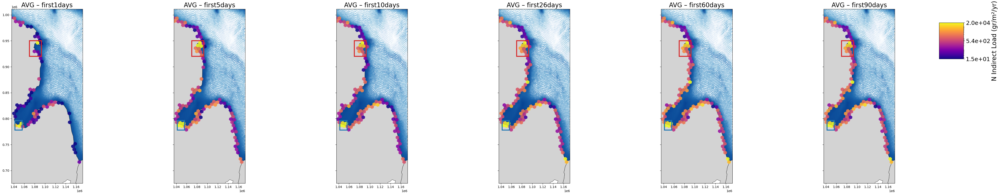

[Counties RAW] crs=EPSG:4326 -> [EPSG:3174] count=4360 bounds=[-14305552.61735841  -8042233.99836776  16305606.43433335
  16739875.79434085]
[NHD RAW] crs=EPSG:4269 -> [EPSG:3174] count=113244 bounds=[ 337331.38196757  425342.33219035 1847767.56219043 1299493.67154364]
✅ Saved: /home/abolmaal/modelling/FVCOM/Huron/Figures/IndirectLoad_N_low_H3_multipanel_insets_release.jpeg


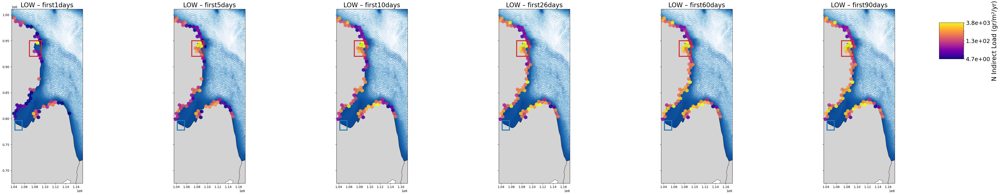

[Counties RAW] crs=EPSG:4326 -> [EPSG:3174] count=4360 bounds=[-14305552.61735841  -8042233.99836776  16305606.43433335
  16739875.79434085]
[NHD RAW] crs=EPSG:4269 -> [EPSG:3174] count=113244 bounds=[ 337331.38196757  425342.33219035 1847767.56219043 1299493.67154364]
✅ Saved: /home/abolmaal/modelling/FVCOM/Huron/Figures/IndirectLoad_N_high_H3_multipanel_insets_release.jpeg


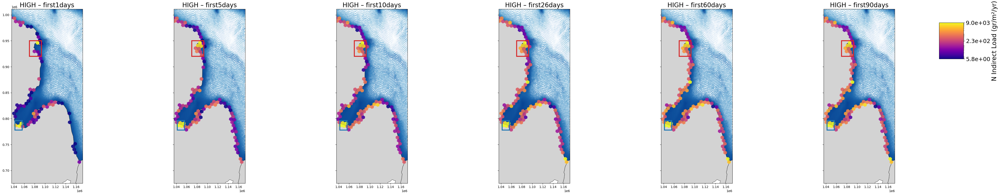

[Counties RAW] crs=EPSG:4326 -> [EPSG:3174] count=4360 bounds=[-14305552.61735841  -8042233.99836776  16305606.43433335
  16739875.79434085]
[NHD RAW] crs=EPSG:4269 -> [EPSG:3174] count=113244 bounds=[ 337331.38196757  425342.33219035 1847767.56219043 1299493.67154364]
✅ Saved: /home/abolmaal/modelling/FVCOM/Huron/Figures/IndirectLoad_N_surge_H3_multipanel_insets_release.jpeg


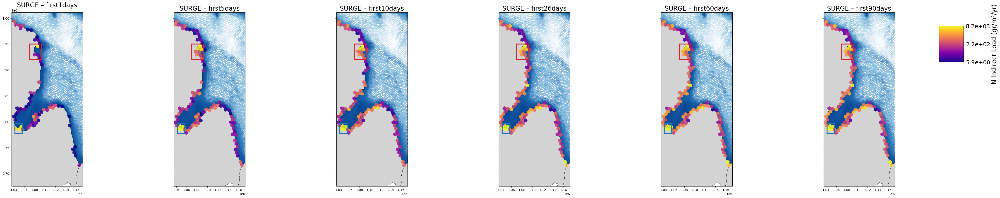

In [14]:
CW_layers = {"avg": CW_avg}
for cat in ["avg", "low", "high", "surge"]:
    plot_wetload_distribution_indirect_release_lens(
        cat=cat,
        release_lens=release_lens,
        grid_metrics_file_name=grid_metrics_file_name,
        Counties=counties,
        CW_layers=CW_layers,
        NHD_flowline=NHD_flowline,
        counties_src_crs="EPSG:4326",
        cw_src_crs="EPSG:3174",
        nhd_src_crs="EPSG:4269",
        value_type="N",
        font_size=20,
        resolution=6,
        output_figures=output_figures,
        extent=[-84, -82.35, 42.65, 45.65],
        auto_expand_extent=False,
        cbar_box=(0.91, 0.66, 0.02, 0.16),
        load_cmap="plasma",
        inset_extents=[
            [1_070_000, 1_093_000, 920_000, 950_000],
            [1_042_000, 1_056_000, 778_000, 796_000],
        ],
        inset_fig_boxes=[[0.895,0.41,0.18,0.24],[0.895,0.17,0.18,0.24]],
        inset_include_hex=False,
    )

In [29]:
from matplotlib.colors import TwoSlopeNorm
import matplotlib.pyplot as plt
import geopandas as gpd
import numpy as np
from shapely.geometry import Point, Polygon
from netCDF4 import Dataset

def plot_wetload_distribution_indirect_diff(
    cat,
    grid_metrics_file_name,
    Counties=None,
    CW_layers=None,
    NHD_flowline=None,
    counties_src_crs=None,
    cw_src_crs=None,
    nhd_src_crs=None,
    value_type="N",
    font_size=18,
    resolution=6,
    output_figures=".",
    extent=[-84, -82.35, 42.65, 45.65],
    auto_expand_extent=False,
    extent_padding_m=5000,
    load_cmap="RdBu_r",
    cbar_box=(0.695, 0.64, 0.01, 0.16),
    inset_extents=None,
    inset_fig_boxes=None,
    inset_include_hex=True,
    show_inset_ticks=False,
    inset_tick_interval_m=5000
):
    """
    Plot the difference in Indirect loads: first90days - first1days,
    with inset zoom boxes.
    """

    # ======================
    # 1. Column mapping
    # ======================
    vt = value_type.upper()
    if vt == "N":
        indirect_col = "TotalIndirectCW_TN_grm2yr"
        units = "gr/m²/yr"
    elif vt == "P":
        indirect_col = "TotalIndirectCW_TP_grm2yr"
        units = "gr/m²/yr"
    else:
        raise ValueError("value_type must be 'N' or 'P'")

    # ======================
    # 2. FVCOM bathymetry
    # ======================
    ds = Dataset(grid_metrics_file_name, "r")
    lon = ds.variables["longitude"][:]
    lat = ds.variables["latitude"][:]
    bathy = -ds.variables["h"][:]
    ds.close()

    bathy_gdf = gpd.GeoDataFrame(
        geometry=[Point(x, y) for x, y in zip(lon, lat)],
        data={"bathy": bathy}, crs="EPSG:4326"
    ).to_crs(TARGET_CRS)

    # ======================
    # 3. Layers (Counties, CW, NHD)
    # ======================
    counties_t, cw_t, nhd_t = None, None, None
    if Counties is not None:
        counties_t = _force_to_target(Counties, src_crs=counties_src_crs, name="Counties")
    if CW_layers is not None:
        src = CW_layers.get(cat, None) if isinstance(CW_layers, dict) else CW_layers
        if src is not None:
            cw_t = _force_to_target(src, src_crs=cw_src_crs, name=f"CW[{cat}]")
    if NHD_flowline is not None:
        nhd_t = _force_to_target(NHD_flowline, src_crs=nhd_src_crs, name="NHD")

    # ======================
    # 4. Extent
    # ======================
    minx, maxx, miny, maxy = _project_extent_4326_to_target(extent, target_crs=TARGET_CRS)
    bathy_gdf = _clip_gdf_box(bathy_gdf, minx, maxx, miny, maxy)
    if counties_t is not None:
        counties_t = _clip_gdf_box(counties_t, minx, maxx, miny, maxy)
    if cw_t is not None:
        cw_t = _clip_gdf_box(cw_t, minx, maxx, miny, maxy)
    if nhd_t is not None:
        nhd_t = _clip_gdf_box(nhd_t, minx, maxx, miny, maxy)

    # ======================
    # 5. Load both release lens
    # ======================
    df90 = globals().get(f"TotalLoad_CW_{cat}_first90days")
    df1  = globals().get(f"TotalLoad_CW_{cat}_first1days")
    if df90 is None or df1 is None:
        raise ValueError(f"❌ Missing dataframe for {cat} first90days or first1days")

    def clean_df(df):
        return df[df.start_lon.notna() & df.start_lat.notna() &
                  (df.start_lon != 0.0) & (df.start_lat != 0.0)].copy()

    df90, df1 = clean_df(df90), clean_df(df1)

    def to_hex(df):
        df["h3_index"] = df.apply(
            lambda r: h3.latlng_to_cell(r.start_lat, r.start_lon, resolution), axis=1
        )
        tmp = df.groupby("h3_index")[indirect_col].mean().reset_index()
        tmp["geometry"] = tmp["h3_index"].apply(
            lambda cell: Polygon([(lon, lat) for lat, lon in h3.cell_to_boundary(cell)])
        )
        gdf = gpd.GeoDataFrame(tmp, geometry="geometry", crs="EPSG:4326").to_crs(TARGET_CRS)
        gdf.rename(columns={indirect_col: "load"}, inplace=True)
        return gdf

    hex90, hex1 = to_hex(df90), to_hex(df1)

    hex_diff = pd.merge(hex90[["h3_index", "load", "geometry"]],
                        hex1[["h3_index", "load"]],
                        on="h3_index", how="outer", suffixes=("_90", "_1"))
    hex_diff["load_diff"] = hex_diff["load_90"].fillna(0) - hex_diff["load_1"].fillna(0)
    hex_diff = gpd.GeoDataFrame(hex_diff, geometry="geometry", crs=TARGET_CRS)
    hex_diff = _clip_gdf_box(hex_diff, minx, maxx, miny, maxy)

    # ======================
    # 6. Color scale
    # ======================
    vals = hex_diff["load_diff"].astype(float).values
    q05, q95 = np.nanquantile(vals, [0.05, 0.95])
    absmax = max(abs(q05), abs(q95))
    vmin, vmax = -absmax, absmax
    norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
    cmap = plt.cm.RdBu_r

    # ======================
    # 7. Plot main map
    # ======================
    fig, ax = plt.subplots(figsize=(26., 26.))
    if bathy_gdf is not None and not bathy_gdf.empty:
        ax.scatter(bathy_gdf.geometry.x, bathy_gdf.geometry.y,
                   c=bathy_gdf["bathy"], cmap="Blues",
                   s=18, marker="s", edgecolor="none", alpha=0.6, zorder=0)
    if counties_t is not None and not counties_t.empty:
        counties_t.plot(ax=ax, facecolor="lightgray", edgecolor="black", linewidth=0.6, zorder=0.5)
    if nhd_t is not None and not nhd_t.empty:
        nhd_t.plot(ax=ax, color="blue", linewidth=1.0, zorder=1.0)

    hex_diff.plot(ax=ax, column="load_diff", cmap=cmap, norm=norm,
                  edgecolor="none", alpha=0.9, zorder=2)
    if cw_t is not None and not cw_t.empty:
        cw_t.plot(ax=ax, facecolor="none", edgecolor="none", linewidth=2.0, alpha=1.0, zorder=5.0)

    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    ax.set_aspect("equal")
    ax.set_title(f"{cat.upper()} – Indirect Load Difference (90d − 1d)", fontsize=font_size)

    # =======================
    # 8. Colorbar
    # =======================
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm._A = []
    cax = fig.add_axes(cbar_box)
    cbar = fig.colorbar(sm, cax=cax)
    cbar.set_label(f"{vt} Load Difference ({units})", fontsize=font_size)

    # =======================
    # 9. Inset zoom boxes
    # =======================
    if inset_extents is None:
        inset_extents = _auto_insets_from_layer(cw_t, k=2, buffer_m=3500) \
                        or _auto_insets_from_layer(nhd_t, k=2, buffer_m=3500)
    if inset_fig_boxes is None:
        inset_fig_boxes = [
            [cbar_box[0] - 0.01, cbar_box[1] - 0.20, 0.115, 0.17],
            [cbar_box[0] - 0.01, cbar_box[1] - 0.40, 0.115, 0.17],
        ]
    if len(inset_fig_boxes) < len(inset_extents):
        last = inset_fig_boxes[-1]
        inset_fig_boxes = inset_fig_boxes + [last] * (len(inset_extents) - len(inset_fig_boxes))

    inset_colors = ["tab:red", "tab:blue", "tab:purple", "tab:orange"][:len(inset_extents or [])]

    for (xmin_i, xmax_i, ymin_i, ymax_i), fig_box, color in zip(inset_extents or [], inset_fig_boxes, inset_colors):
        # locator rectangle
        ax.add_patch(
            plt.Polygon(
                [[xmin_i, ymin_i], [xmax_i, ymin_i], [xmax_i, ymax_i], [xmin_i, ymax_i]],
                closed=True, fill=False, ec=color, lw=4.0, zorder=6
            )
        )
        # inset axes
        ax_zoom = fig.add_axes(fig_box)
        for s in ax_zoom.spines.values():
            s.set_edgecolor(color); s.set_linewidth(3.0)

        sub_bathy = _clip_gdf_box(bathy_gdf,  xmin_i, xmax_i, ymin_i, ymax_i)
        sub_cnty  = _clip_gdf_box(counties_t, xmin_i, xmax_i, ymin_i, ymax_i) if counties_t is not None else None
        sub_hex   = _clip_gdf_box(hex_diff,   xmin_i, xmax_i, ymin_i, ymax_i)
        sub_nhd   = _clip_gdf_box(nhd_t,      xmin_i, xmax_i, ymin_i, ymax_i) if nhd_t is not None else None
        sub_cw    = _clip_gdf_box(cw_t,       xmin_i, xmax_i, ymin_i, ymax_i) if cw_t is not None else None

        if sub_bathy is not None and not sub_bathy.empty:
            ax_zoom.scatter(sub_bathy.geometry.x, sub_bathy.geometry.y,
                            c=sub_bathy["bathy"], cmap="Blues",
                            s=1.4, marker="s", edgecolor="none", alpha=0.65, zorder=0)
        if sub_cnty is not None and not sub_cnty.empty:
            sub_cnty.plot(ax=ax_zoom, facecolor="lightgray", edgecolor="black",
                          linewidth=0.6, zorder=0.5)
        if sub_nhd is not None and not sub_nhd.empty:
            sub_nhd.plot(ax=ax_zoom, color="blue", linewidth=1.5, zorder=1.2)
        if sub_hex is not None and not sub_hex.empty:
            sub_hex.plot(ax=ax_zoom, column="load_diff", cmap=cmap, norm=norm,
                         edgecolor="none", alpha=0.95, zorder=1.4)
        if sub_cw is not None and not sub_cw.empty:
            sub_cw.plot(ax=ax_zoom, facecolor="none", edgecolor="none",
                        linewidth=2.4, alpha=0.95, zorder=6.0)
            sub_cw.plot(ax=ax_zoom, facecolor="none", edgecolor="none",
                        linewidth=1.6, alpha=1.0, zorder=6.1)

        ax_zoom.set_aspect("equal")
        _apply_ticks(ax_zoom, xmin_i, xmax_i, ymin_i, ymax_i,
                     interval_m=inset_tick_interval_m,
                     fontsize=font_size-6,
                     show=show_inset_ticks)

    # =======================
    # 10. Save
    # =======================
    outpath = os.path.join(output_figures, f"IndirectLoadDiff_{vt}_{cat}_90d_minus_1d.jpeg")
    plt.savefig(outpath, dpi=300, bbox_inches="tight")
    print(f"✅ Saved: {outpath}")
    plt.show()
    plt.close()


[Counties RAW] crs=EPSG:4326 -> [EPSG:3174] count=4360 bounds=[-14305552.61735841  -8042233.99836776  16305606.43433335
  16739875.79434085]
[CW[avg] RAW] crs=EPSG:3174 -> [EPSG:3174] count=3892 bounds=[1025248.6251  717988.3169 1165407.043   999719.3573]
[NHD RAW] crs=EPSG:4269 -> [EPSG:3174] count=113244 bounds=[ 337331.38196757  425342.33219035 1847767.56219043 1299493.67154364]
✅ Saved: /home/abolmaal/modelling/FVCOM/Huron/Figures/IndirectLoadDiff_N_avg_90d_minus_1d.jpeg


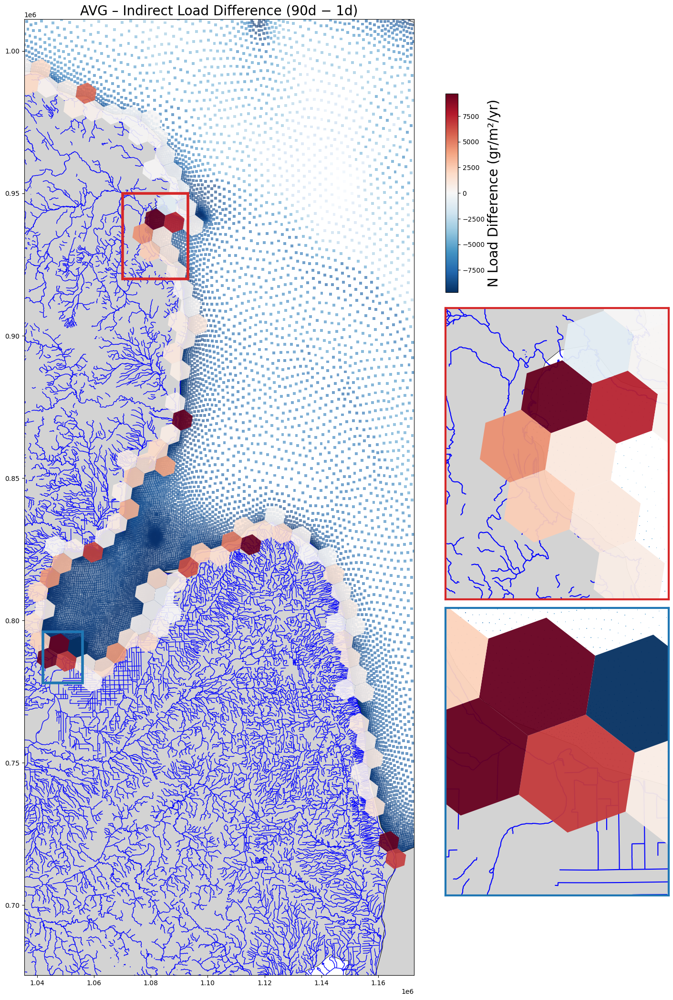

[Counties RAW] crs=EPSG:4326 -> [EPSG:3174] count=4360 bounds=[-14305552.61735841  -8042233.99836776  16305606.43433335
  16739875.79434085]
[NHD RAW] crs=EPSG:4269 -> [EPSG:3174] count=113244 bounds=[ 337331.38196757  425342.33219035 1847767.56219043 1299493.67154364]
✅ Saved: /home/abolmaal/modelling/FVCOM/Huron/Figures/IndirectLoadDiff_N_low_90d_minus_1d.jpeg


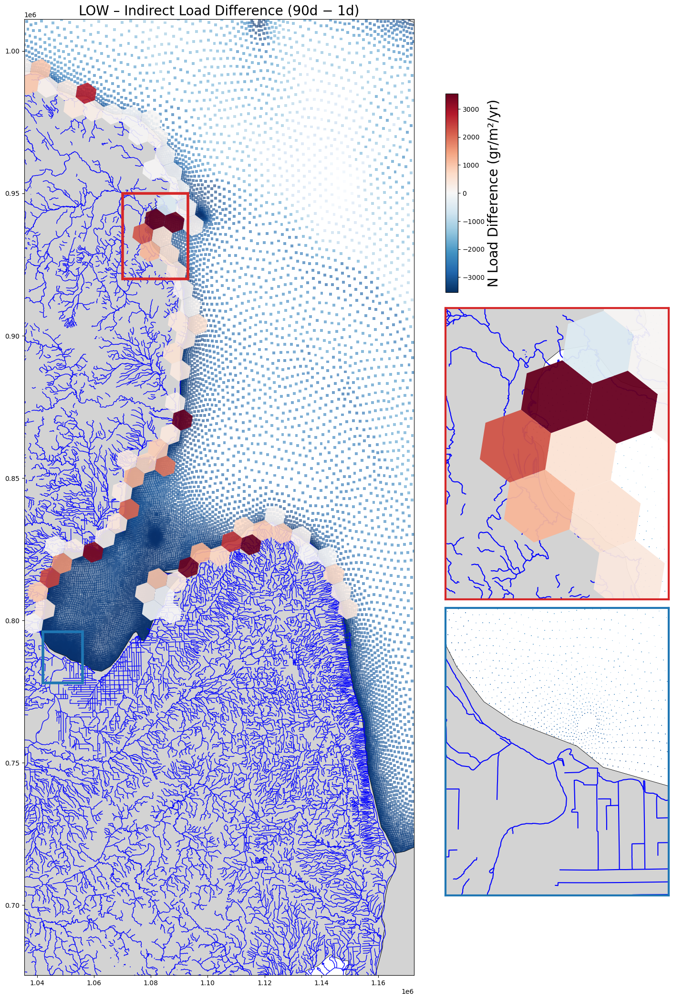

[Counties RAW] crs=EPSG:4326 -> [EPSG:3174] count=4360 bounds=[-14305552.61735841  -8042233.99836776  16305606.43433335
  16739875.79434085]
[NHD RAW] crs=EPSG:4269 -> [EPSG:3174] count=113244 bounds=[ 337331.38196757  425342.33219035 1847767.56219043 1299493.67154364]
✅ Saved: /home/abolmaal/modelling/FVCOM/Huron/Figures/IndirectLoadDiff_N_high_90d_minus_1d.jpeg


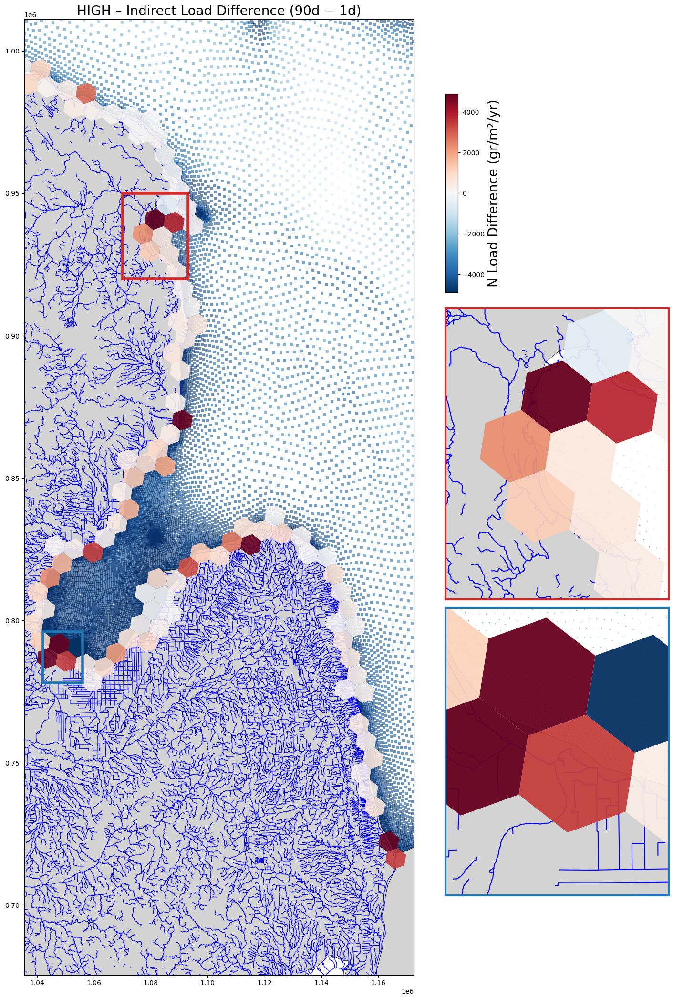

[Counties RAW] crs=EPSG:4326 -> [EPSG:3174] count=4360 bounds=[-14305552.61735841  -8042233.99836776  16305606.43433335
  16739875.79434085]
[NHD RAW] crs=EPSG:4269 -> [EPSG:3174] count=113244 bounds=[ 337331.38196757  425342.33219035 1847767.56219043 1299493.67154364]
✅ Saved: /home/abolmaal/modelling/FVCOM/Huron/Figures/IndirectLoadDiff_N_surge_90d_minus_1d.jpeg


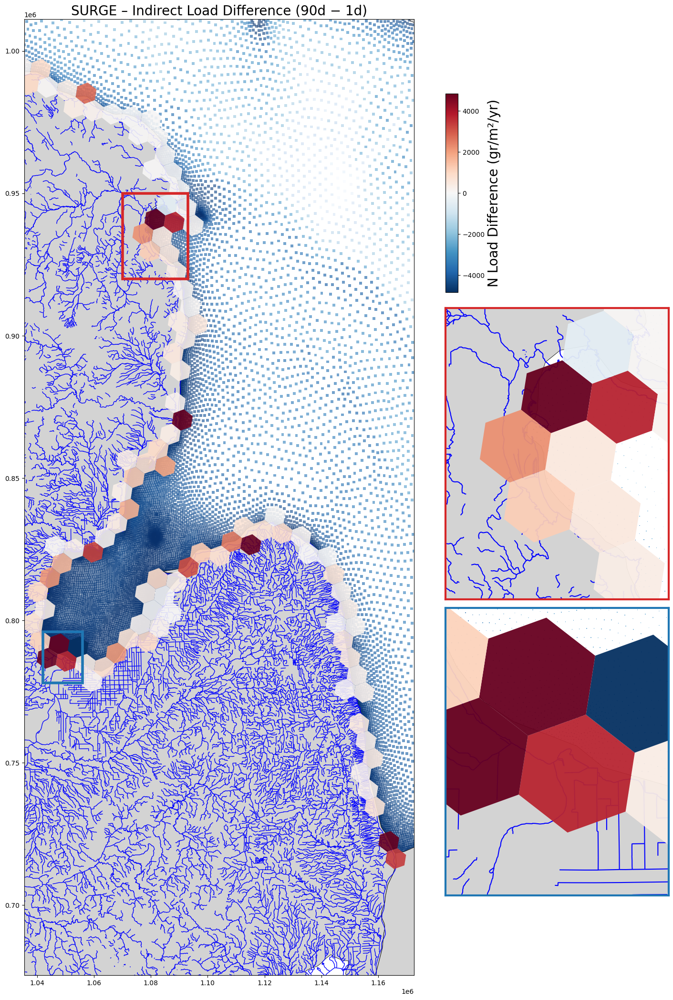

In [30]:
CW_layers = {"avg": CW_avg}
for cat in ["avg", "low", "high", "surge"]:
    plot_wetload_distribution_indirect_diff(
        cat=cat,
        grid_metrics_file_name=grid_metrics_file_name,
        Counties=counties,
        CW_layers=CW_layers,
        NHD_flowline=NHD_flowline,
        counties_src_crs="EPSG:4326",
        cw_src_crs="EPSG:3174",
        nhd_src_crs="EPSG:4269",
        value_type="N",
        font_size=20,
        resolution=6,
        output_figures=output_figures,
        extent=[-84, -82.35, 42.65, 45.65],
        auto_expand_extent=False,
        cbar_box=(0.695, 0.66, 0.01, 0.16),
        load_cmap="plasma",
        inset_extents=[
            [1_070_000, 1_093_000, 920_000, 950_000],
            [1_042_000, 1_056_000, 778_000, 796_000],
        ],
        inset_fig_boxes=[[0.695,0.41,0.18,0.24],[0.695,0.17,0.18,0.24]],
        inset_include_hex=False,
    )